In [1]:
#importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import neighbors
from sklearn import linear_model
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error as mse
from sklearn.linear_model import LinearRegression
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso
from sklearn import svm
from math import sqrt
import datetime
from collections import Counter

In [2]:
#reading the data from reviews_summary.csv
reviews_summary = pd.read_csv('reviews_summary.csv')
listings_summary = pd.read_csv('listings_summary.csv')


In [3]:
#getting the summary of reviews_summary
reviews_summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401963 entries, 0 to 401962
Data columns (total 6 columns):
listing_id       401963 non-null int64
id               401963 non-null int64
date             401963 non-null object
reviewer_id      401963 non-null int64
reviewer_name    401963 non-null object
comments         401467 non-null object
dtypes: int64(3), object(3)
memory usage: 18.4+ MB


In [4]:
#checking the null values of the columns of reviews_summary
reviews_summary.isnull().sum()

listing_id         0
id                 0
date               0
reviewer_id        0
reviewer_name      0
comments         496
dtype: int64

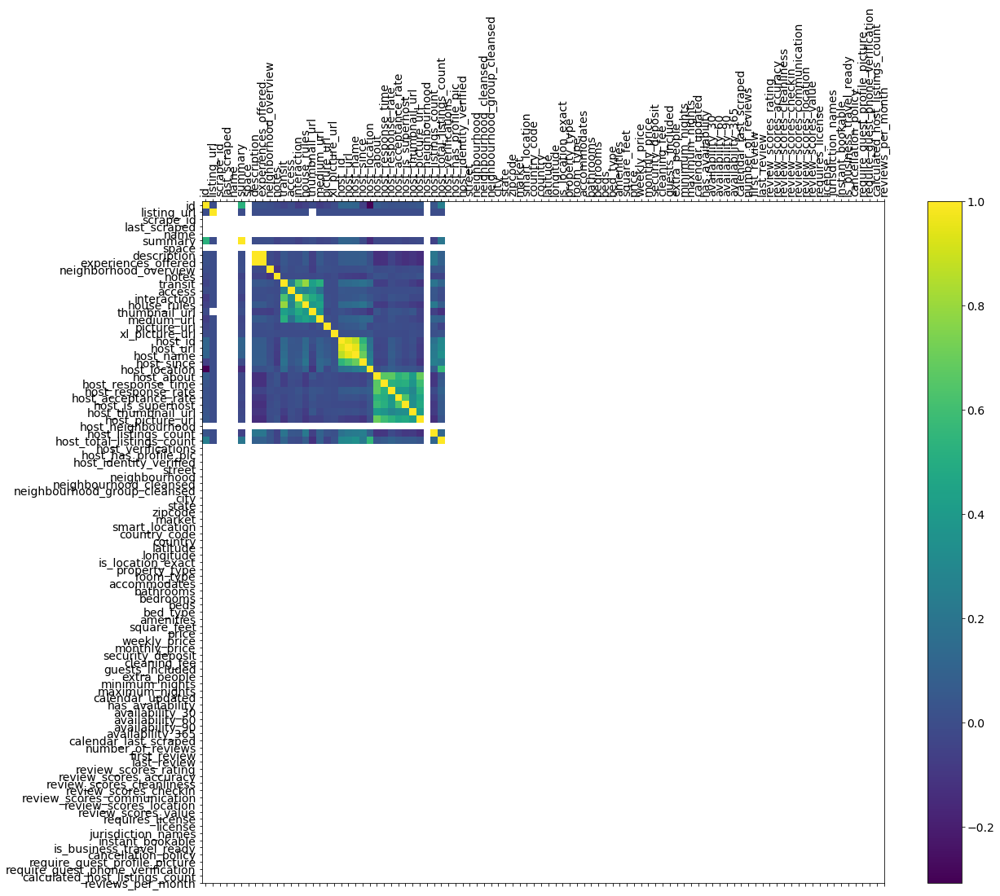

In [5]:
f = plt.figure(figsize=(19, 15))
plt.matshow(listings_summary.corr(), fignum=f.number)
plt.xticks(range(listings_summary.shape[1]), listings_summary.columns, fontsize=14, rotation=90)
plt.yticks(range(listings_summary.shape[1]), listings_summary.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)

In [6]:
#defining a new dataframe and keeping the relevant columns
columns_to_keep = ['id','host_has_profile_pic','host_since','neighbourhood_cleansed', 'neighbourhood_group_cleansed',
                   'host_is_superhost',
                   'latitude', 'longitude','is_location_exact', 'property_type', 'room_type', 'accommodates', 'bathrooms',  
                   'bedrooms', 'bed_type', 'amenities', 'price', 'cleaning_fee',
                   'reviews_per_month','number_of_reviews',
                   'security_deposit', 'extra_people', 'guests_included', 'minimum_nights',  
                   'instant_bookable', 'cancellation_policy','availability_365']


In [7]:
#adding the column to listings_summary
listings_summary = listings_summary[columns_to_keep]

In [8]:
#getting the summary of columns of the new dataframe
listings_summary.isnull().sum()

id                                 0
host_has_profile_pic              26
host_since                        26
neighbourhood_cleansed             0
neighbourhood_group_cleansed       0
host_is_superhost                 26
latitude                           0
longitude                          0
is_location_exact                  0
property_type                      0
room_type                          0
accommodates                       0
bathrooms                         32
bedrooms                          18
bed_type                           0
amenities                          0
price                              0
cleaning_fee                    7146
reviews_per_month               3914
number_of_reviews                  0
security_deposit                9361
extra_people                       0
guests_included                    0
minimum_nights                     0
instant_bookable                   0
cancellation_policy                0
availability_365                   0
d

In [9]:
#to view all columns of the data set
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [10]:
#to view all the unique values of column 'host_has_profile_pic'
listings_summary['host_has_profile_pic'].unique()

array(['t', 'f', nan], dtype=object)

In [11]:
#printing the unique values of column 'is_location_exact' and 'instant_bookable'
print(listings_summary['is_location_exact'].unique())
print(listings_summary['instant_bookable'].unique())

['f' 't']
['f' 't']


In [12]:
#replacing the null values with 'f'
listings_summary['host_has_profile_pic'].fillna('f',inplace=True)

In [13]:
#mapping the values f to 0 and t to 1
listings_summary['is_location_exact'] = listings_summary['is_location_exact'].map({'f':0,'t':1})
listings_summary['host_is_superhost'] = listings_summary['host_is_superhost'].map({'f':0,'t':1})
listings_summary['instant_bookable'] = listings_summary['instant_bookable'].map({'f':0,'t':1})
listings_summary['host_has_profile_pic'] = listings_summary['host_has_profile_pic'].map({'f':0,'t':1})

In [14]:
listings_summary.head(1)

,id,host_has_profile_pic,host_since,neighbourhood_cleansed,neighbourhood_group_cleansed,host_is_superhost,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,bed_type,amenities,price,cleaning_fee,reviews_per_month,number_of_reviews,security_deposit,extra_people,guests_included,minimum_nights,instant_bookable,cancellation_policy,availability_365
0,2015,1,2008-08-18,Brunnenstr. Süd,Mitte,1.0,52.534537,13.402557,0,Guesthouse,Entire home/apt,3,1.0,1.0,Real Bed,"{TV,""Cable TV"",Wifi,Kitchen,Gym,Heating,""Famil...",$60.00,$30.00,3.76,118,$200.00,$28.00,1,4,0,strict_14_with_grace_period,141


(array([   82.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0., 22470.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

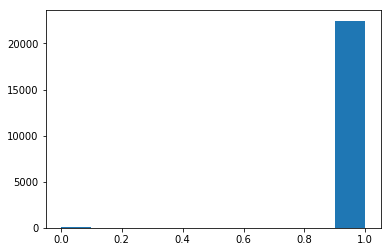

In [15]:
plt.hist(listings_summary['host_has_profile_pic'])

In [16]:
#counting the 0 and 1 values of the column 'host_has_profile_pic
listings_summary['host_has_profile_pic'].value_counts()

1    22470
0       82
Name: host_has_profile_pic, dtype: int64

In [17]:
#changing the data type of the column
listings_summary['cleaning_fee'] = listings_summary['cleaning_fee'].str.extract(r'[$](\d+)').astype(float)
listings_summary['price'] = listings_summary['price'].str.extract(r'[$](\d+)').astype(float)
listings_summary['security_deposit'] = listings_summary['security_deposit'].str.extract(r'[$](\d+)').astype(float)
listings_summary['extra_people'] = listings_summary['extra_people'].str.extract(r'[$](\d+)').astype(float)

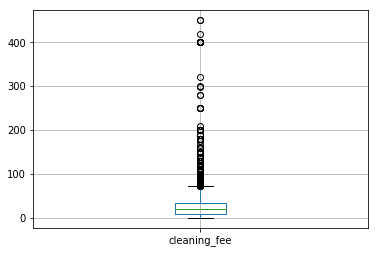

In [18]:
# boxplot of cleaning_fee
listings_summary.boxplot('cleaning_fee')
plt.show()

In [19]:
#replacing the null values of column 'cleaning_fee' with median
listings_summary['cleaning_fee'].fillna(listings_summary['cleaning_fee'].median(), inplace=True)

In [20]:
#checking the number of null_values of column 'cleaning_fee'
listings_summary['cleaning_fee'].isnull().sum()

0

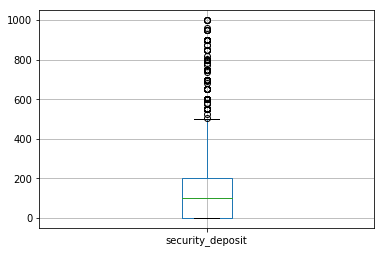

In [21]:
#Boxplot of security_deposit
listings_summary.boxplot('security_deposit')
plt.show()

In [22]:
#replacing the null values of column 'security_deposit' with median
listings_summary['security_deposit'].fillna(listings_summary['security_deposit'].median(), inplace=True)

#checking the sum of null values of column 'security_deposits'
listings_summary['security_deposit'].isna().sum()

0

In [23]:
#describing the statistics of column 'price'
listings_summary['price'].describe()

count    22552.000000
mean        58.899965
std         50.802635
min          0.000000
25%         30.000000
50%         45.000000
75%         70.000000
max        999.000000
Name: price, dtype: float64

In [24]:
#assigning the 0 values of column price to 'filter_price_zero'
filter_price_zero = listings_summary['price'] == 0

In [25]:
#droppping the filter_price_zero
listings_summary = listings_summary.drop(listings_summary[filter_price_zero].index,axis = 0)

In [26]:
#getting the dimension of listing_summary
listings_summary.shape

(22544, 27)

In [27]:
#getting the summary of column 'listings_summary'
listings_summary.isnull().sum()

id                                 0
host_has_profile_pic               0
host_since                        26
neighbourhood_cleansed             0
neighbourhood_group_cleansed       0
host_is_superhost                 26
latitude                           0
longitude                          0
is_location_exact                  0
property_type                      0
room_type                          0
accommodates                       0
bathrooms                         32
bedrooms                          18
bed_type                           0
amenities                          0
price                              0
cleaning_fee                       0
reviews_per_month               3912
number_of_reviews                  0
security_deposit                   0
extra_people                       0
guests_included                    0
minimum_nights                     0
instant_bookable                   0
cancellation_policy                0
availability_365                   0
d

In [28]:
#to find value_count of unique values of column
z = listings_summary['neighbourhood_cleansed'].value_counts()

In [29]:
#Calculating count of neighbourhood
others = []
for i in set(listings_summary['neighbourhood_cleansed']):
    if z[i]<200:
        others.append(i)
len(others)

104

In [30]:
#if value count is less than 200 change the neighbourhood to 'Others'
def otherSub(x):
    if x in others:
        return 'Others'
    else:
        return x



listings_summary['neighbourhood_cleansed'] = listings_summary['neighbourhood_cleansed'].apply(otherSub)

In [31]:
#to find value_count of unique values of column
listings_summary['neighbourhood_cleansed'].value_counts()

Others                      4616
Tempelhofer Vorstadt        1324
Frankfurter Allee Süd FK    1280
Alexanderplatz              1091
Reuterstraße                1002
Rixdorf                      880
Neuköllner Mitte/Zentrum     797
Brunnenstr. Süd              773
Frankfurter Allee Nord       734
Schillerpromenade            662
südliche Luisenstadt         643
Prenzlauer Berg Nordwest     623
Prenzlauer Berg Südwest      618
Schöneberg-Nord              567
Prenzlauer Berg Süd          554
Wedding Zentrum              517
Moabit West                  490
nördliche Luisenstadt        484
Schöneberg-Süd               474
Helmholtzplatz               459
Prenzlauer Berg Nord         411
Südliche Friedrichstadt      390
Moabit Ost                   378
Karl-Marx-Allee-Süd          364
Parkviertel                  355
Osloer Straße                347
Brunnenstr. Nord             279
Karl-Marx-Allee-Nord         274
Tempelhof                    268
Prenzlauer Berg Ost          241
Neu Lichte

In [32]:
#getting the value counts of column 'bathrooms'
listings_summary['bathrooms'].value_counts()

1.0    19801
2.0     1268
1.5     1145
0.5      104
2.5       74
3.0       50
0.0       41
4.0       12
3.5        3
8.5        3
7.0        3
7.5        2
5.0        2
8.0        2
4.5        1
6.0        1
Name: bathrooms, dtype: int64

In [33]:
#replacing the null values with 1
listings_summary['bathrooms'].fillna(1,inplace= True)

In [34]:
#getting the value_count of column 'bedrooms'
listings_summary['bedrooms'].value_counts()

1.0     17159
2.0      2970
0.0      1477
3.0       723
4.0       143
5.0        34
6.0        10
8.0         4
7.0         3
10.0        1
9.0         1
12.0        1
Name: bedrooms, dtype: int64

In [35]:
#replacing the null values of column bedrooms with 1
listings_summary['bedrooms'].fillna(1,inplace = True)

In [36]:
#finding the sum of null values of listings_summary
listings_summary.isnull().sum()

id                                 0
host_has_profile_pic               0
host_since                        26
neighbourhood_cleansed             0
neighbourhood_group_cleansed       0
host_is_superhost                 26
latitude                           0
longitude                          0
is_location_exact                  0
property_type                      0
room_type                          0
accommodates                       0
bathrooms                          0
bedrooms                           0
bed_type                           0
amenities                          0
price                              0
cleaning_fee                       0
reviews_per_month               3912
number_of_reviews                  0
security_deposit                   0
extra_people                       0
guests_included                    0
minimum_nights                     0
instant_bookable                   0
cancellation_policy                0
availability_365                   0
d

In [37]:
#drop the null values of column 'host_since'
listings_summary.drop(listings_summary[listings_summary['host_since'].isnull()].index , axis=0, inplace= True)

In [38]:
#drop the null values of column 'host_is_superhost'
listings_summary.drop(listings_summary[listings_summary['host_is_superhost'].isnull()].index , axis=0, inplace= True)

In [39]:
#resetting the index
listings_summary.reset_index(inplace=True)

In [40]:
#getting the value_count of column 'cancellation_policy'
listings_summary['cancellation_policy'].value_counts()

flexible                       9082
moderate                       7086
strict_14_with_grace_period    6283
super_strict_30                  53
super_strict_60                  14
Name: cancellation_policy, dtype: int64

In [41]:
#replacing the null values of column with the median
listings_summary['reviews_per_month'] = listings_summary['reviews_per_month'].fillna(listings_summary['reviews_per_month'].median())

In [42]:
#splitting the values of column 'amenities'
listings_summary['Number_of_amenities'] = listings_summary['amenities'].apply(lambda x:len(x.split(',')))

In [43]:
#creating the columns for seperate amenities
listings_summary['Laptop_friendly_workspace'] = listings_summary['amenities'].str.contains('Laptop friendly workspace')
listings_summary['TV'] = listings_summary['amenities'].str.contains('TV')
listings_summary['Family_kid_friendly'] = listings_summary['amenities'].str.contains('Family/kid friendly')
listings_summary['Host_greets_you'] = listings_summary['amenities'].str.contains('Host greets you')
listings_summary['Smoking_allowed'] = listings_summary['amenities'].str.contains('Smoking allowed')
listings_summary['Hot_water'] = listings_summary['amenities'].str.contains('Hot water')
listings_summary['Fridge'] = listings_summary['amenities'].str.contains('Refrigerator')

In [44]:
#dropping the column amenities
listings_summary.drop(['amenities'],axis=1,inplace=True)

In [45]:
#converted date to number of days
from dateutil import parser

def diff_date(row):
    today = parser.parse('2018-11-7')
    return ((today - parser.parse(row['host_since'])).days)/365.25

In [46]:
#viewing the statistics of host_since column
listings_summary['host_since'] = listings_summary.apply(diff_date,axis=1)
listings_summary['host_since'].describe()

count    22518.000000
mean         3.686432
std          1.909644
min          0.002738
25%          2.335387
50%          3.529090
75%          5.059548
max         10.220397
Name: host_since, dtype: float64

In [47]:
#improting the math libraries
from math import sin, cos, sqrt, atan2, radians

In [48]:
#calculating the distance of berlin airport from the apartments
def distance_airport(row):
    berlin_lat,berlin_long = radians(52.3733), radians(13.5064)
    R = 6373.0
    long = radians(row['longitude'])
    lat = radians(row['latitude'])
    
    dlon = long - berlin_long
    dlat = lat - berlin_lat
    a = sin(dlat / 2)**2 + cos(lat) * cos(berlin_lat) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    return R * c

In [49]:
#calculating the distance of berlin railway station from the apartments
def distance_rail(row):
    berlin_lat,berlin_long = radians(52.5073), radians(13.3324)
    R = 6373.0
    long = radians(row['longitude'])
    lat = radians(row['latitude'])
    
    dlon = long - berlin_long
    dlat = lat - berlin_lat
    a = sin(dlat / 2)**2 + cos(lat) * cos(berlin_lat) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    return R * c

In [50]:
#Coverted latitudes and logitude to distance
listings_summary['distance_airport'] = listings_summary.apply(distance_airport,axis=1)
listings_summary['distance_railways'] = listings_summary.apply(distance_airport,axis=1)
listings_summary['distance_avg'] = (listings_summary['distance_airport'] +listings_summary['distance_railways'] )/2.0

In [51]:
listings_summary.head(5)

,index,id,host_has_profile_pic,host_since,neighbourhood_cleansed,neighbourhood_group_cleansed,host_is_superhost,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,bed_type,price,cleaning_fee,reviews_per_month,number_of_reviews,security_deposit,extra_people,guests_included,minimum_nights,instant_bookable,cancellation_policy,availability_365,Number_of_amenities,Laptop_friendly_workspace,TV,Family_kid_friendly,Host_greets_you,Smoking_allowed,Hot_water,Fridge,distance_airport,distance_railways,distance_avg
0,0,2015,1,10.220397,Brunnenstr. Süd,Mitte,1.0,52.534537,13.402557,0,Guesthouse,Entire home/apt,3,1.0,1.0,Real Bed,60.0,30.0,3.76,118,200.0,28.0,1,4,0,strict_14_with_grace_period,141,29,True,True,True,False,False,True,True,19.266232,19.266232,19.266232
1,1,2695,1,10.140999,Prenzlauer Berg Nordwest,Pankow,0.0,52.548513,13.404553,1,Apartment,Private room,2,1.0,1.0,Real Bed,17.0,0.0,1.42,6,0.0,0.0,1,2,0,flexible,0,10,True,False,False,False,False,False,False,20.675116,20.675116,20.675116
2,2,3176,1,10.050650,Prenzlauer Berg Südwest,Pankow,0.0,52.534996,13.417579,1,Apartment,Entire home/apt,4,1.0,1.0,Real Bed,90.0,50.0,1.25,143,200.0,20.0,2,62,1,strict_14_with_grace_period,220,19,True,False,True,False,False,False,False,18.966373,18.966373,18.966373
3,3,3309,1,9.998631,Schöneberg-Nord,Tempelhof - Schöneberg,0.0,52.498855,13.349065,1,Apartment,Private room,2,1.0,1.0,Pull-out Sofa,26.0,30.0,0.39,25,250.0,18.0,1,5,0,strict_14_with_grace_period,297,29,True,False,False,True,False,True,False,17.574477,17.574477,17.574477
4,4,7071,1,9.478439,Helmholtzplatz,Pankow,1.0,52.543157,13.415091,1,Apartment,Private room,2,1.0,1.0,Real Bed,42.0,0.0,1.75,197,0.0,24.0,1,2,0,moderate,26,13,True,False,True,False,False,True,False,19.880937,19.880937,19.880937


In [52]:
#getting the summary of data frame
listings_summary.isnull().sum()

index                           0
id                              0
host_has_profile_pic            0
host_since                      0
neighbourhood_cleansed          0
neighbourhood_group_cleansed    0
host_is_superhost               0
latitude                        0
longitude                       0
is_location_exact               0
property_type                   0
room_type                       0
accommodates                    0
bathrooms                       0
bedrooms                        0
bed_type                        0
price                           0
cleaning_fee                    0
reviews_per_month               0
number_of_reviews               0
security_deposit                0
extra_people                    0
guests_included                 0
minimum_nights                  0
instant_bookable                0
cancellation_policy             0
availability_365                0
Number_of_amenities             0
Laptop_friendly_workspace       0
TV            

In [53]:
listings_summary['Laptop_friendly_workspace'] = listings_summary['Laptop_friendly_workspace'].map({True:1,False:0})

In [54]:
listings_summary.head(5)

,index,id,host_has_profile_pic,host_since,neighbourhood_cleansed,neighbourhood_group_cleansed,host_is_superhost,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,bed_type,price,cleaning_fee,reviews_per_month,number_of_reviews,security_deposit,extra_people,guests_included,minimum_nights,instant_bookable,cancellation_policy,availability_365,Number_of_amenities,Laptop_friendly_workspace,TV,Family_kid_friendly,Host_greets_you,Smoking_allowed,Hot_water,Fridge,distance_airport,distance_railways,distance_avg
0,0,2015,1,10.220397,Brunnenstr. Süd,Mitte,1.0,52.534537,13.402557,0,Guesthouse,Entire home/apt,3,1.0,1.0,Real Bed,60.0,30.0,3.76,118,200.0,28.0,1,4,0,strict_14_with_grace_period,141,29,1,True,True,False,False,True,True,19.266232,19.266232,19.266232
1,1,2695,1,10.140999,Prenzlauer Berg Nordwest,Pankow,0.0,52.548513,13.404553,1,Apartment,Private room,2,1.0,1.0,Real Bed,17.0,0.0,1.42,6,0.0,0.0,1,2,0,flexible,0,10,1,False,False,False,False,False,False,20.675116,20.675116,20.675116
2,2,3176,1,10.050650,Prenzlauer Berg Südwest,Pankow,0.0,52.534996,13.417579,1,Apartment,Entire home/apt,4,1.0,1.0,Real Bed,90.0,50.0,1.25,143,200.0,20.0,2,62,1,strict_14_with_grace_period,220,19,1,False,True,False,False,False,False,18.966373,18.966373,18.966373
3,3,3309,1,9.998631,Schöneberg-Nord,Tempelhof - Schöneberg,0.0,52.498855,13.349065,1,Apartment,Private room,2,1.0,1.0,Pull-out Sofa,26.0,30.0,0.39,25,250.0,18.0,1,5,0,strict_14_with_grace_period,297,29,1,False,False,True,False,True,False,17.574477,17.574477,17.574477
4,4,7071,1,9.478439,Helmholtzplatz,Pankow,1.0,52.543157,13.415091,1,Apartment,Private room,2,1.0,1.0,Real Bed,42.0,0.0,1.75,197,0.0,24.0,1,2,0,moderate,26,13,1,False,True,False,False,True,False,19.880937,19.880937,19.880937


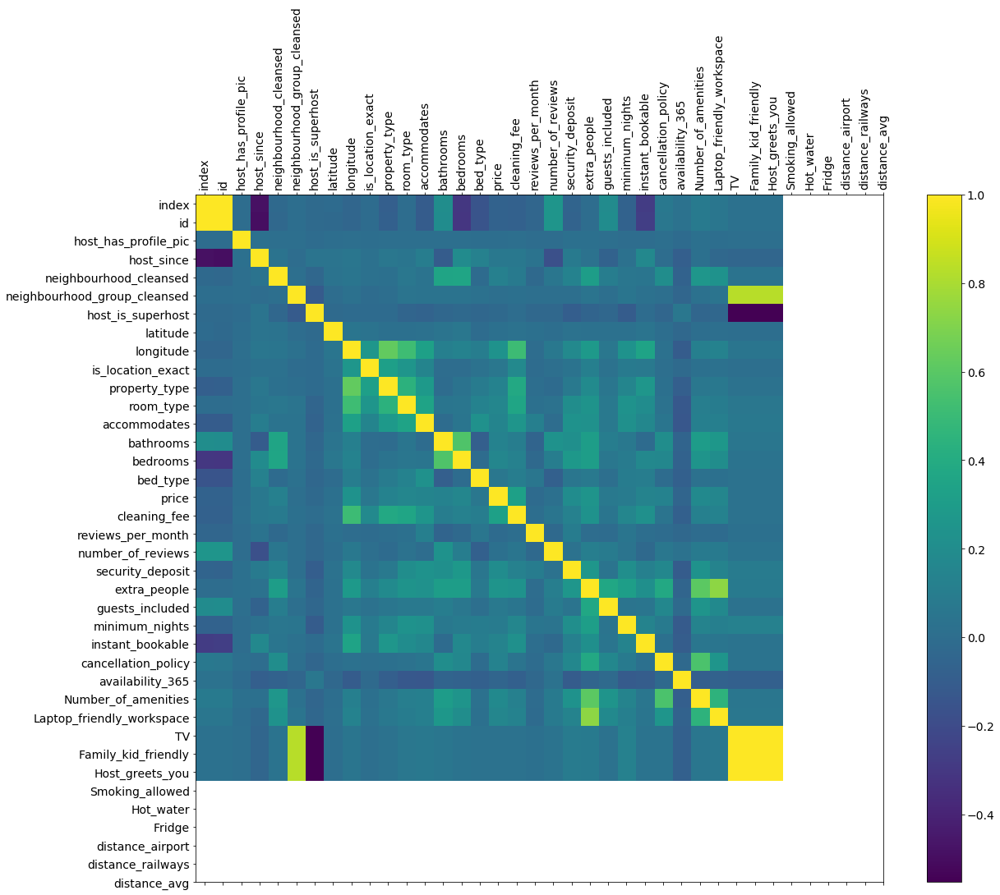

In [55]:
f = plt.figure(figsize=(19, 15))
plt.matshow(listings_summary.corr(), fignum=f.number)
plt.xticks(range(listings_summary.shape[1]), listings_summary.columns, fontsize=14, rotation=90)
plt.yticks(range(listings_summary.shape[1]), listings_summary.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)

# Exploratory Analysis

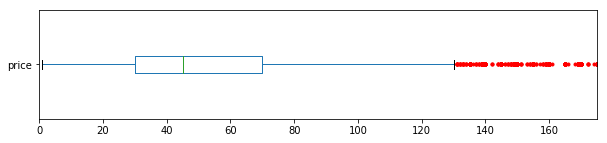

In [56]:
# boxplot of price column
red_square = dict(markerfacecolor='r', markeredgecolor='r', marker='.')
listings_summary['price'].plot(kind='box', xlim=(0, 175), vert=False, flierprops=red_square, figsize=(10,2));


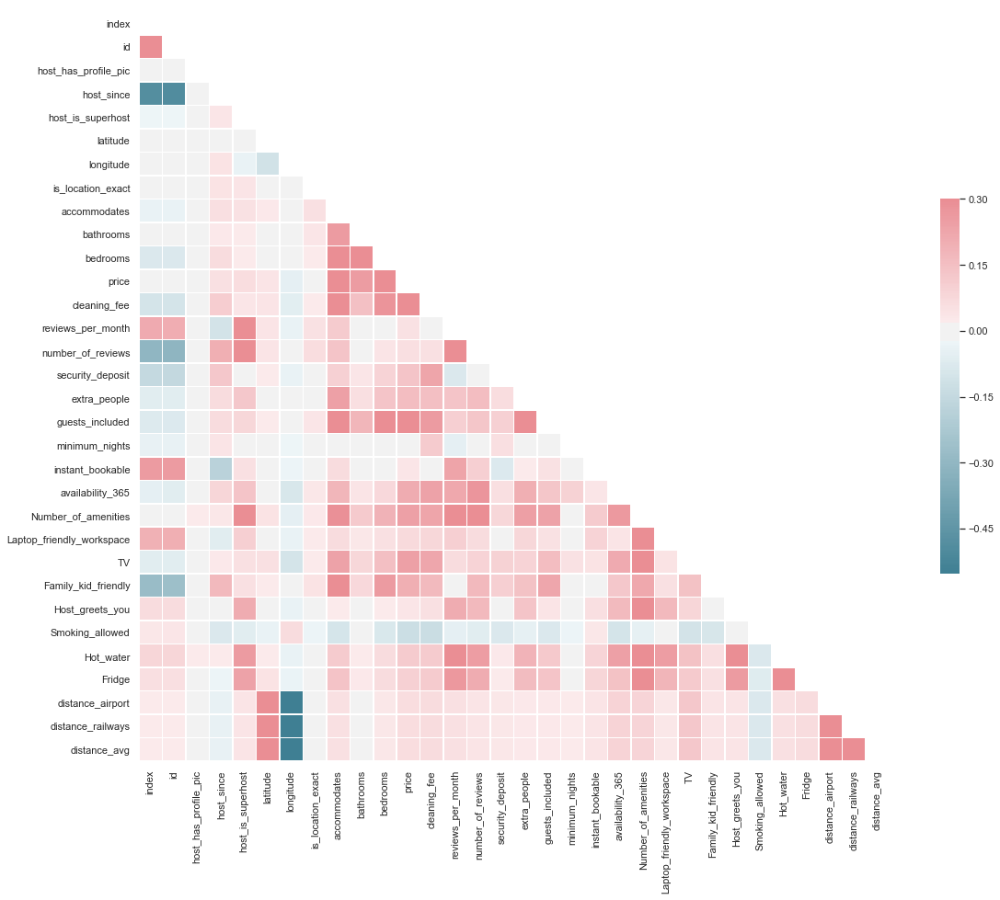

In [57]:
sns.set(style="white")
corr = listings_summary.corr()

# generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# set up the matplotlib figure
fig, ax = plt.subplots(figsize=(20, 15))

# generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink":.5},cbar=True);

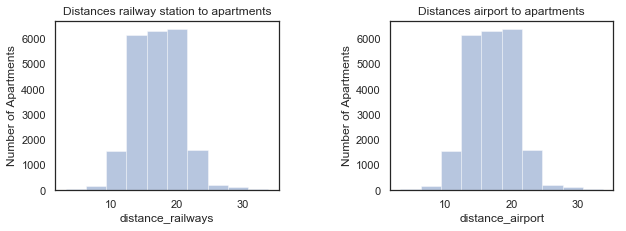

In [58]:
fig = plt.figure(figsize=(10,6))
#ax0 = fig.add_subplot(2, 2, 1)
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2)

#plotting graph between railway station to apartments
sns.distplot(listings_summary["distance_railways"], bins=10, kde=False,ax=ax1)
ax1.set_title('Distances railway station to apartments')
ax1.set_xlabel('distance_railways')
ax1.set_ylabel('Number of Apartments')

#plotting graph between berlin airport to apartments
sns.distplot(listings_summary["distance_airport"], bins=10, kde=False,ax=ax2)
ax2.set_title('Distances airport to apartments')
ax2.set_xlabel('distance_airport')
ax2.set_ylabel('Number of Apartments')

plt.subplots_adjust(top = 0.99, bottom=0.01, hspace=0.5, wspace=0.5)
plt.show()

In [59]:
def mapper(month):
    date = datetime.datetime(2000, month, 1)  # You need a dateobject with the proper month
    return date.strftime('%b')  # %b returns the months abbreviation, other options [here][1]

In [60]:
#extracting the year, month and date to new columns
reviews_summary['date'] = pd.to_datetime(reviews_summary['date'])
reviews_summary['year'] = reviews_summary['date'].dt.year
reviews_summary['month'] = reviews_summary['date'].dt.month
reviews_summary['day'] = reviews_summary['date'].dt.day
reviews_summary['year'] = reviews_summary['year'].astype(int)
reviews_summary['month'] = reviews_summary['month'].astype(int)
reviews_summary['day'] = reviews_summary['day'].astype(int)


In [61]:
reviews_summary.sort_values(['year', 'month'], ascending=[True, True],axis=0,inplace=True) #sorting frame by year,month asc

In [62]:
reviews_summary['month'] = reviews_summary['month'].apply(mapper) ##convert month to month name

In [63]:
#creating a copy of the data frame
reviews_summary = reviews_summary.copy(deep=False) 

In [64]:
#listing the columns
reviews_summary.columns

Index(['listing_id', 'id', 'date', 'reviewer_id', 'reviewer_name', 'comments',
       'year', 'month', 'day'],
      dtype='object')

In [65]:
#drop the column 'reviewer_name'
dropped = ['reviewer_name']
reviews_summary.drop(dropped,axis=1,inplace=True)

In [66]:
#counting the unique values of the column 'year'
reviews_summary['year'].value_counts()

2018    152448
2017    111799
2016     69303
2015     39470
2014     17702
2013      7422
2012      3092
2011       617
2010       107
2009         3
Name: year, dtype: int64

In [67]:
#creating new columns with the value of the year
df_2015 = reviews_summary[reviews_summary['year'] == 2015]
df_2016 = reviews_summary[reviews_summary['year'] == 2016]
df_2017 = reviews_summary[reviews_summary['year'] == 2017]
df_2018 = reviews_summary[reviews_summary['year'] == 2018]

In [68]:
#creating a list of columns and dropping it
dropped = ['year','day','id','date','listing_id']
df_2015.drop(dropped,axis=1,inplace=True)
df_2016.drop(dropped,axis=1,inplace=True)
df_2017.drop(dropped,axis=1,inplace=True)
df_2018.drop(dropped,axis=1,inplace=True)

C:\Users\Ace\Anaconda3\lib\site-packages\pandas\core\frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


In [69]:
#counting the reviewers on monthly basis 
df_2015["count"] = df_2015.groupby("month")["reviewer_id"].transform('count')
df_2016["count"] = df_2016.groupby("month")["reviewer_id"].transform('count')
df_2017["count"] = df_2017.groupby("month")["reviewer_id"].transform('count')
df_2018["count"] = df_2018.groupby("month")["reviewer_id"].transform('count')

C:\Users\Ace\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\Ace\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\Ace\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the doc

In [70]:
#droppping the irrelevant data
dropped = ['reviewer_id']
df_2015.drop(dropped,axis=1,inplace=True)
df_2016.drop(dropped,axis=1,inplace=True)
df_2017.drop(dropped,axis=1,inplace=True)
df_2018.drop(dropped,axis=1,inplace=True)
df_2015 = df_2015.drop_duplicates()
df_2016 = df_2016.drop_duplicates()
df_2017 = df_2017.drop_duplicates()
df_2018 = df_2018.drop_duplicates()
df_2015=df_2015.reset_index(drop=True)
df_2016=df_2016.reset_index(drop=True)
df_2017=df_2017.reset_index(drop=True)
df_2018=df_2018.reset_index(drop=True)

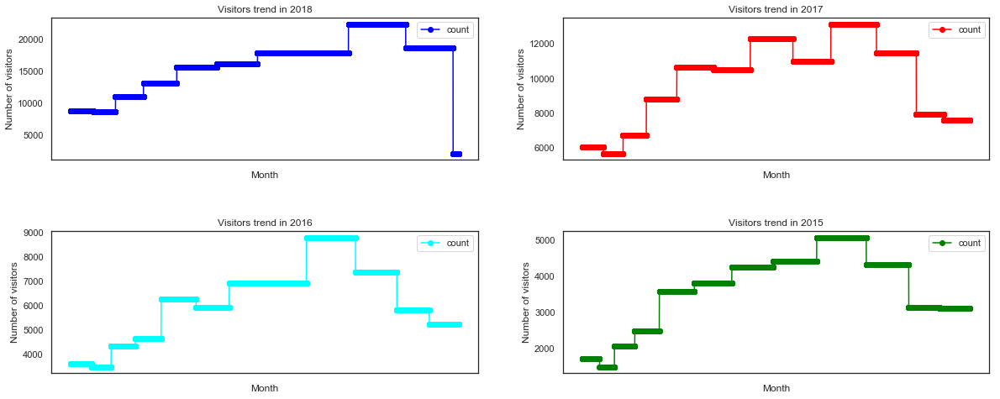

In [71]:
fig = plt.figure(figsize=(20, 6))
ax0 = fig.add_subplot(2, 2, 1)
ax1 = fig.add_subplot(2, 2, 2)
ax2 = fig.add_subplot(2, 2, 3)
ax3 = fig.add_subplot(2, 2, 4)

#creating the plot for year 2018
df_2018.plot(kind='line', color='blue', x='month',y='count',marker='o',ax=ax0) # add to subplot 1
ax0.set_title('Visitors trend in 2018')
ax0.set_xlabel('Month')
ax0.set_ylabel('Number of visitors')

#creating the plot for year 2017
df_2017.plot(kind='line', color='red', x='month',y='count',marker='o',ax=ax1) # add to subplot 2
ax1.set_title('Visitors trend in 2017')
ax1.set_xlabel('Month')
ax1.set_ylabel('Number of visitors')

#creating the plot for year 2016
df_2016.plot(kind='line', color='cyan', x='month',y='count',marker='o',ax=ax2) # add to subplot 3
ax2.set_title('Visitors trend in 2016')
ax2.set_xlabel('Month')
ax2.set_ylabel('Number of visitors')

#creating the plot for year 2015
df_2015.plot(kind='line', color='green', x='month',y='count',marker='o',ax=ax3) # add to subplot 4
ax3.set_title('Visitors trend in 2015')
ax3.set_xlabel('Month')
ax3.set_ylabel('Number of visitors')
plt.subplots_adjust(top = 0.99, bottom=0.01, hspace=0.5)
plt.show()

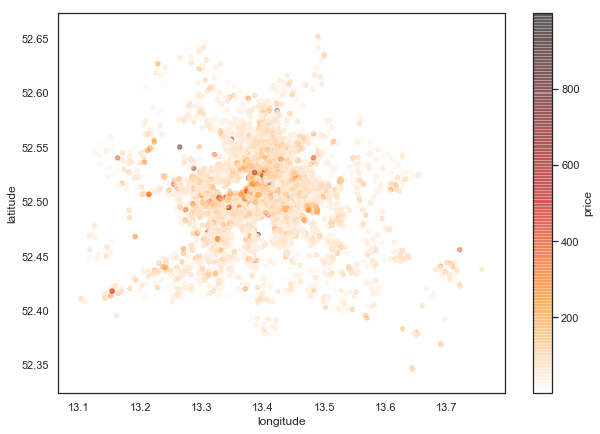

In [72]:
listings_summary.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4, figsize=(10,7), 
        c="price", cmap="gist_heat_r", colorbar=True, sharex=False)

Text(0.5, 1.0, '\nHeatmap: Median Prices by Neighbourhood and Number of Bedrooms\n\n')

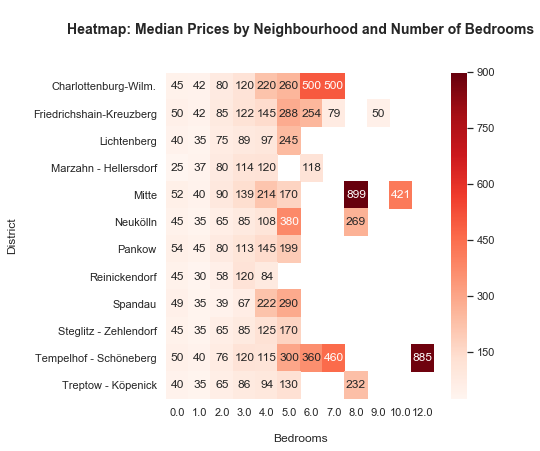

In [73]:
#creating a heatmap for Median prices by neighbourhood and number of bedrooms
plt.figure(figsize=(6,6))
sns.heatmap(listings_summary.groupby(['neighbourhood_group_cleansed', 'bedrooms']).price.median().unstack(), 
            cmap='Reds', annot=True, fmt=".0f")

plt.xlabel('\nBedrooms', fontsize=12)
plt.ylabel('District\n', fontsize=12)
plt.title('\nHeatmap: Median Prices by Neighbourhood and Number of Bedrooms\n\n', fontsize=14, fontweight='bold')

In [74]:
#Modify the listings_summary to keep only a select few coloumns for further analysis on the data.
ctk = ["Number_of_amenities", "number_of_reviews", "id","availability_365", "neighbourhood_cleansed", "property_type", "price", "room_type"]

In [75]:
#Update listings_summary with the following attributes for further use.
listing_summary = listings_summary[ctk]

In [76]:
#To show the first ten records of listings_summary with updated attributes.
listing_summary.head(10)

,Number_of_amenities,number_of_reviews,id,availability_365,neighbourhood_cleansed,property_type,price,room_type
0,29,118,2015,141,Brunnenstr. Süd,Guesthouse,60.0,Entire home/apt
1,10,6,2695,0,Prenzlauer Berg Nordwest,Apartment,17.0,Private room
2,19,143,3176,220,Prenzlauer Berg Südwest,Apartment,90.0,Entire home/apt
3,29,25,3309,297,Schöneberg-Nord,Apartment,26.0,Private room
4,13,197,7071,26,Helmholtzplatz,Apartment,42.0,Private room
5,37,6,9991,137,Prenzlauer Berg Südwest,Apartment,180.0,Entire home/apt
6,13,23,14325,129,Prenzlauer Berg Nordwest,Apartment,70.0,Entire home/apt
7,9,0,16401,365,Frankfurter Allee Süd FK,Apartment,120.0,Private room
8,20,48,16644,159,nördliche Luisenstadt,Apartment,90.0,Entire home/apt
9,21,279,17409,42,Prenzlauer Berg Südwest,Condominium,45.0,Private room


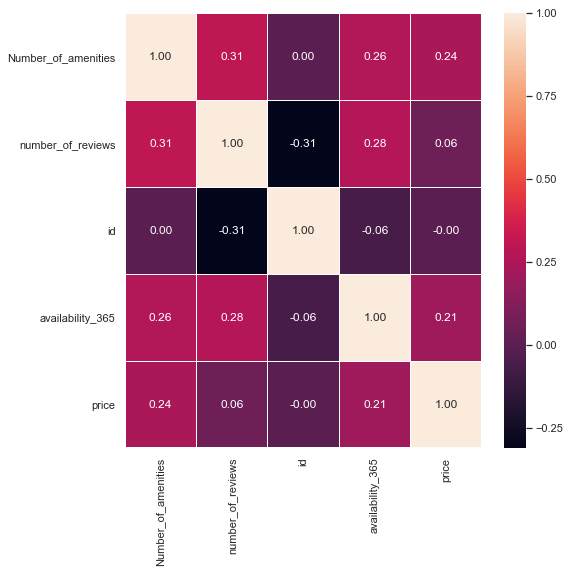

In [77]:
#Plot a heat map with selected important attributes from listings_summary.csv
f,ax = plt.subplots(figsize=(8,8))
sns.heatmap(listing_summary.corr(),annot=True,linewidth=.15,fmt ='.2f',ax = ax)

In [78]:
#Group different types of rooms according to the listings_summary.csv and print them.
room_types = listing_summary.groupby(['room_type'])
for name, rdata in room_types:
    print(name)


Entire home/apt
Private room
Shared room


In [79]:
#Calculate the mean/average price of each type of room and store in room_price. Data type of which is float64.
room_price = room_types['price'].agg(np.mean)


In [80]:
#Print the average room price of each room type.
print(room_price)


room_type
Entire home/apt    80.081543
Private room       39.904654
Shared room        34.689189
Name: price, dtype: float64


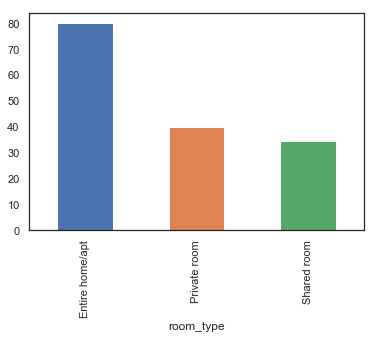

In [81]:
#Plot a bar graph of the average price of different room types. 
room_types['price'].agg(np.mean).plot(kind='bar')
plt.show()

In [82]:
#Group different neighbourhoods 
neighbourhood = listing_summary.groupby(['neighbourhood_cleansed'])
for i,y in neighbourhood : 
    print(i)

Alexanderplatz
Brunnenstr. Nord
Brunnenstr. Süd
Frankfurter Allee Nord
Frankfurter Allee Süd FK
Helmholtzplatz
Karl-Marx-Allee-Nord
Karl-Marx-Allee-Süd
Moabit Ost
Moabit West
Neu Lichtenberg
Neuköllner Mitte/Zentrum
Osloer Straße
Others
Parkviertel
Prenzlauer Berg Nord
Prenzlauer Berg Nordwest
Prenzlauer Berg Ost
Prenzlauer Berg Süd
Prenzlauer Berg Südwest
Regierungsviertel
Reuterstraße
Rixdorf
Schillerpromenade
Schöneberg-Nord
Schöneberg-Süd
Südliche Friedrichstadt
Tempelhof
Tempelhofer Vorstadt
Volkspark Wilmersdorf
Wedding Zentrum
nördliche Luisenstadt
südliche Luisenstadt


In [83]:
#Groupby neighbourhoods and show average price of all the listings in that neighbourhood as well as the count of such listings.
listing_summary.groupby(['neighbourhood_cleansed'])['price'].agg(['mean','count'])


,mean,count
neighbourhood_cleansed,,
Alexanderplatz,85.584940,1089
Brunnenstr. Nord,49.265233,279
Brunnenstr. Süd,81.056921,773
Frankfurter Allee Nord,56.376022,734
Frankfurter Allee Süd FK,56.126761,1278
Helmholtzplatz,69.725490,459
Karl-Marx-Allee-Nord,55.380952,273
Karl-Marx-Allee-Süd,59.933884,363
Moabit Ost,60.092838,377


In [84]:
#Groupby different room types of listings in different neighbourhoods and the average price of all the listings in that particular neighbourhood.
listing_summary.groupby(['neighbourhood_cleansed','room_type'])['price'].agg(['mean'])


mean
neighbourhood_cleansed   room_type                  
Alexanderplatz           Entire home/apt  111.122581
                         Private room      54.881235
                         Shared room       25.020833
Brunnenstr. Nord         Entire home/apt   73.732673
                         Private room      35.508475
                         Shared room       13.000000
Brunnenstr. Süd          Entire home/apt   98.815353
                         Private room      51.574468
                         Shared room       53.777778
Frankfurter Allee Nord   Entire home/apt   75.564103
                         Private room      42.288462
                         Shared room       35.333333
Frankfurter Allee Süd FK Entire home/apt   75.385147
                         Private room      40.215942
                         Shared room       37.000000
Helmholtzplatz           Entire home/apt   83.371622
                         Private room      44.764331
                         Shared room       49.666667
Karl-Marx-Allee-Nord     Entire home/apt   73.458647
                         Private room      38.260870
                         Shared room       34.500000
Karl-Marx-Allee-Süd      Entire home/apt   93.089552
                         Private room      41.931507
                         Shared room        9.900000
Moabit Ost               Entire home/apt   89.347059
                         Private room      36.169903
                         Shared room       15.000000
Moabit West              Entire home/apt   66.457286
                         Private room      34.943463
                         Shared room       52.428571
Neu Lichtenberg          Entire home/apt   63.110000
                         Private room      32.097015
                         Shared room       34.000000
Neuköllner Mitte/Zentrum Entire home/apt   64.402878
                         Private room      33.904854
                         Shared room       27.500000
Osloer Straße            Entire home/apt   58.908333
                         Private room      32.451923
                         Shared room       19.166667
Others                   Entire home/apt   77.226472
                         Private room      39.574007
                         Shared room       34.000000
Parkviertel              Entire home/apt   58.422222
                         Private room      28.827103
                         Shared room       24.000000
Prenzlauer Berg Nord     Entire home/apt   71.698565
                         Private room      37.693467
                         Shared room       45.333333
Prenzlauer Berg Nordwest Entire home/apt   77.035191
                         Private room      41.213768
                         Shared room       44.000000
Prenzlauer Berg Ost      Entire home/apt   75.766667
                         Private room      37.758333
                         Shared room       40.000000
Prenzlauer Berg Süd      Entire home/apt   85.583596
                         Private room      46.573276
                         Shared room       31.600000
Prenzlauer Berg Südwest  Entire home/apt   91.719160
                         Private room      47.076923
                         Shared room       37.000000
Regierungsviertel        Entire home/apt  132.694656
                         Private room      70.923077
                         Shared room       92.000000
Reuterstraße             Entire home/apt   67.122172
                         Private room      38.012681
                         Shared room       28.000000
Rixdorf                  Entire home/apt   59.360000
                         Private room      33.418564
                         Shared room       36.888889
Schillerpromenade        Entire home/apt   66.526316
                         Private room      36.621984
                         Shared room       27.500000
Schöneberg-Nord          Entire home/apt   75.655914
                         Private room      47.039855
                    

In [85]:
#Groupby different room types in each neighbourhood and the average price of listings per room type and the count of such listings.
listing_summary.groupby(['neighbourhood_cleansed','room_type'])['price'].agg(['mean', 'count'])


mean  count
neighbourhood_cleansed   room_type                         
Alexanderplatz           Entire home/apt  111.122581    620
                         Private room      54.881235    421
                         Shared room       25.020833     48
Brunnenstr. Nord         Entire home/apt   73.732673    101
                         Private room      35.508475    177
                         Shared room       13.000000      1
Brunnenstr. Süd          Entire home/apt   98.815353    482
                         Private room      51.574468    282
                         Shared room       53.777778      9
Frankfurter Allee Nord   Entire home/apt   75.564103    312
                         Private room      42.288462    416
                         Shared room       35.333333      6
Frankfurter Allee Süd FK Entire home/apt   75.385147    579
                         Private room      40.215942    690
                         Shared room       37.000000      9
Helmholtzplatz           Entire home/apt   83.371622    296
                         Private room      44.764331    157
                         Shared room       49.666667      6
Karl-Marx-Allee-Nord     Entire home/apt   73.458647    133
                         Private room      38.260870    138
                         Shared room       34.500000      2
Karl-Marx-Allee-Süd      Entire home/apt   93.089552    134
                         Private room      41.931507    219
                         Shared room        9.900000     10
Moabit Ost               Entire home/apt   89.347059    170
                         Private room      36.169903    206
                         Shared room       15.000000      1
Moabit West              Entire home/apt   66.457286    199
                         Private room      34.943463    283
                         Shared room       52.428571      7
Neu Lichtenberg          Entire home/apt   63.110000    100
                         Private room      32.097015    134
                         Shared room       34.000000      2
Neuköllner Mitte/Zentrum Entire home/apt   64.402878    278
                         Private room      33.904854    515
                         Shared room       27.500000      2
Osloer Straße            Entire home/apt   58.908333    120
                         Private room      32.451923    208
                         Shared room       19.166667     18
Others                   Entire home/apt   77.226472   2327
                         Private room      39.574007   2216
                         Shared room       34.000000     69
Parkviertel              Entire home/apt   58.422222    135
                         Private room      28.827103    214
                         Shared room       24.000000      5
Prenzlauer Berg Nord     Entire home/apt   71.698565    209
                         Private room      37.693467    199
                         Shared room       45.333333      3
Prenzlauer Berg Nordwest Entire home/apt   77.035191    341
                         Private room      41.213768    276
                         Shared room       44.000000      5
Prenzlauer Berg Ost      Entire home/apt   75.766667    120
                         Private room      37.758333    120
                         Shared room       40.000000      1
Prenzlauer Berg Süd      Entire home/apt   85.583596    317
                         Private room      46.573276    232
                         Shared room       31.600000      5
Prenzlauer Berg Südwest  Entire home/apt   91.719160    381
                         Private room      47.076923    234
                         Shared room       37.000000      3
Regierungsviertel        Entire home/apt  132.694656    131
                         Private room      70.923077     78
                         Shared room       92.000000      3
Reuterstraße             Entire home/apt   67.122172    442
                         Private room      38.012681    552
                         Sha

In [86]:
#Drop all listings which do not fall under one of the three room types to get more accurate results. There are 35 such records/listings which have room type as "Others".
listings_summary_without_n =listing_summary.drop(listing_summary[listing_summary['neighbourhood_cleansed']=='Others'].index)
listings_summary_without_n

,Number_of_amenities,number_of_reviews,id,availability_365,neighbourhood_cleansed,property_type,price,room_type
0,29,118,2015,141,Brunnenstr. Süd,Guesthouse,60.0,Entire home/apt
1,10,6,2695,0,Prenzlauer Berg Nordwest,Apartment,17.0,Private room
2,19,143,3176,220,Prenzlauer Berg Südwest,Apartment,90.0,Entire home/apt
3,29,25,3309,297,Schöneberg-Nord,Apartment,26.0,Private room
4,13,197,7071,26,Helmholtzplatz,Apartment,42.0,Private room
5,37,6,9991,137,Prenzlauer Berg Südwest,Apartment,180.0,Entire home/apt
6,13,23,14325,129,Prenzlauer Berg Nordwest,Apartment,70.0,Entire home/apt
7,9,0,16401,365,Frankfurter Allee Süd FK,Apartment,120.0,Private room
8,20,48,16644,159,nördliche Luisenstadt,Apartment,90.0,Entire home/apt
9,21,279,17409,42,Prenzlauer Berg Südwest,Condominium,45.0,Private room


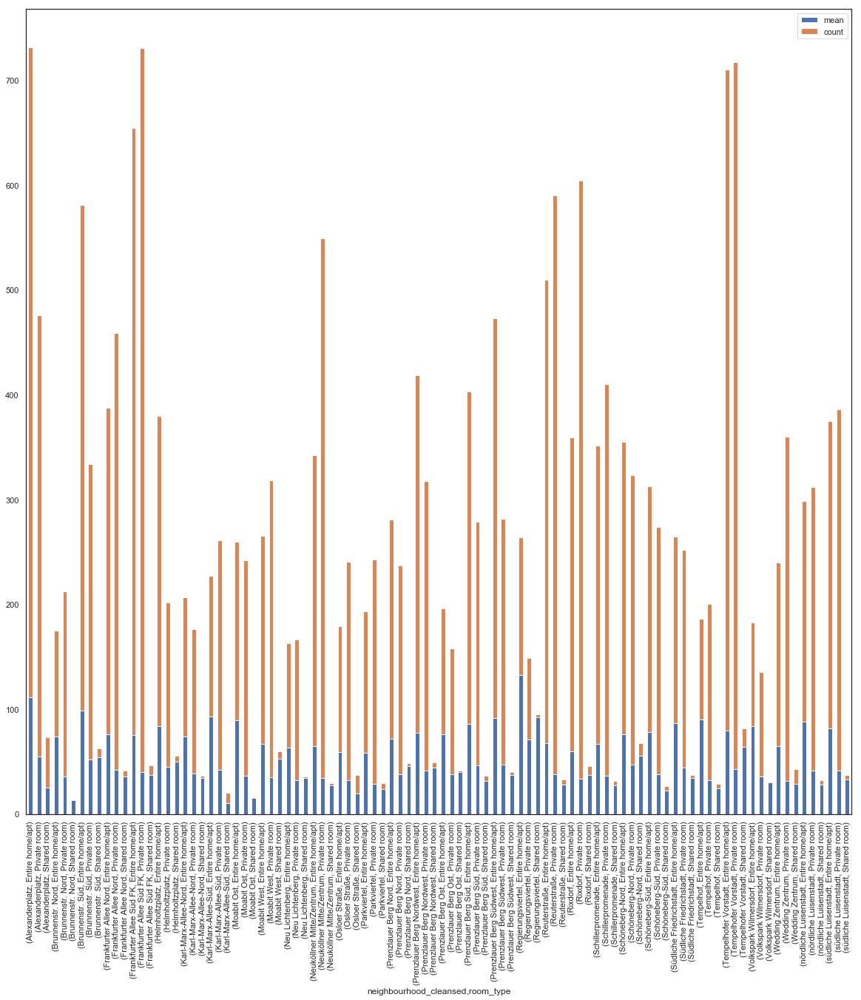

In [87]:
#Plot a bar chart with average price of each room type and count of such listings for each neighbourhood.
plt.rcParams["figure.figsize"] = [20, 20]
listings_summary_without_n.groupby(['neighbourhood_cleansed','room_type'])['price'].agg(['mean', 'count']).plot.bar(stacked=True)

In [88]:
#Print 1 record of listings_summary to show which attributes are used for further calculations.
listings_summary.head(1)

,index,id,host_has_profile_pic,host_since,neighbourhood_cleansed,neighbourhood_group_cleansed,host_is_superhost,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,bed_type,price,cleaning_fee,reviews_per_month,number_of_reviews,security_deposit,extra_people,guests_included,minimum_nights,instant_bookable,cancellation_policy,availability_365,Number_of_amenities,Laptop_friendly_workspace,TV,Family_kid_friendly,Host_greets_you,Smoking_allowed,Hot_water,Fridge,distance_airport,distance_railways,distance_avg
0,0,2015,1,10.220397,Brunnenstr. Süd,Mitte,1.0,52.534537,13.402557,0,Guesthouse,Entire home/apt,3,1.0,1.0,Real Bed,60.0,30.0,3.76,118,200.0,28.0,1,4,0,strict_14_with_grace_period,141,29,1,True,True,False,False,True,True,19.266232,19.266232,19.266232


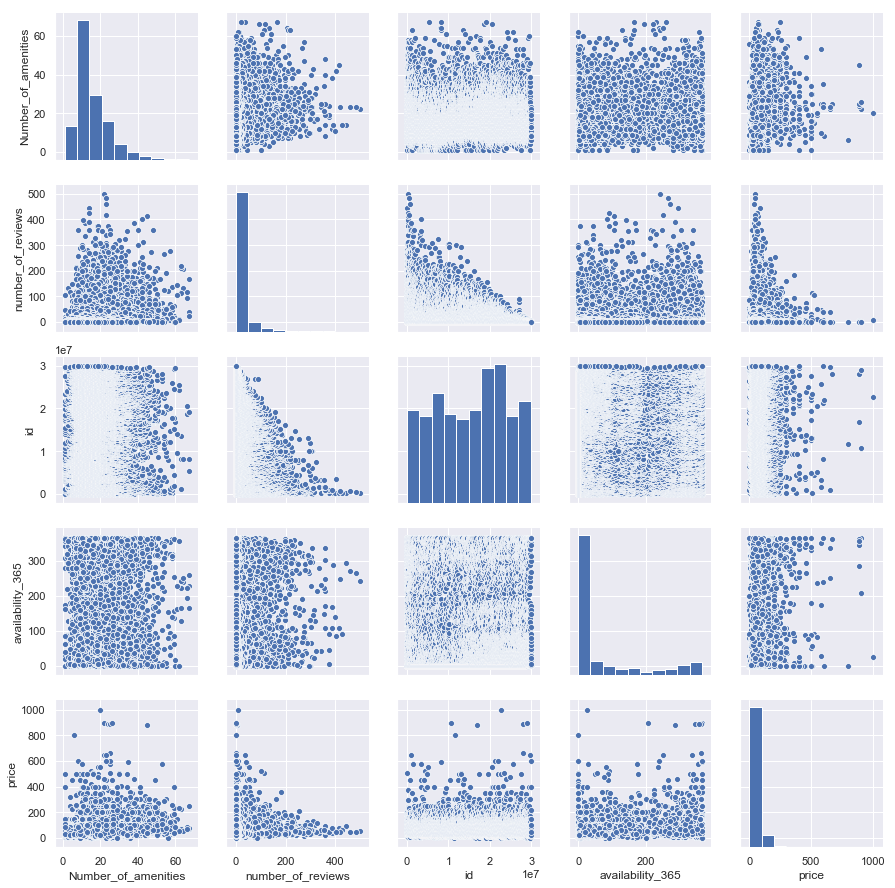

In [89]:
#Pair-plot between the five important attributes out of all. 
sns.set()
cols = ['Number_of_amenities','number_of_reviews','id','availability_365','price']
sns.pairplot(listings_summary_without_n,height=2.5)
#plt.show()

C:\Users\Ace\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


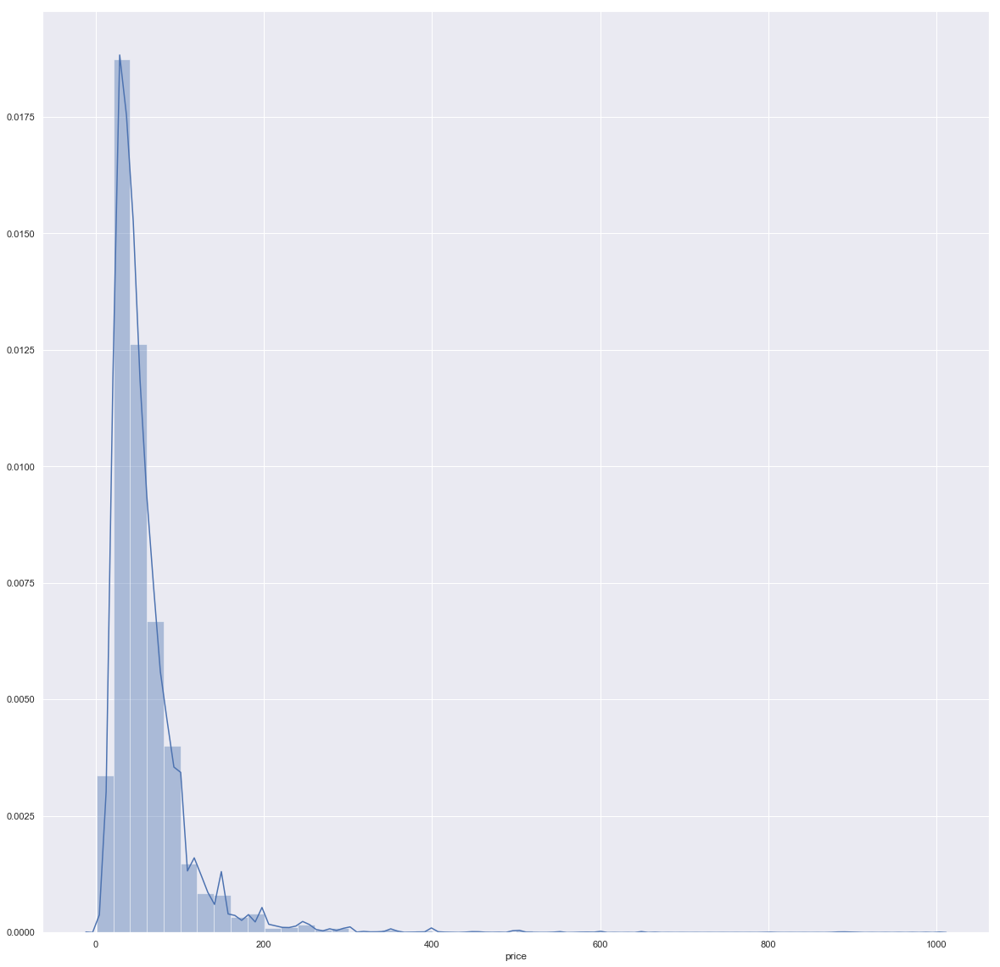

In [90]:
#A distribution plot between the price of listings on x-axis and percentage of listings that fall in that price range.
#plot the histogram
sns.distplot(listing_summary['price']) 


In [91]:
#converted categor
category = ['neighbourhood_cleansed','neighbourhood_group_cleansed','property_type','room_type',
           'bed_type','cancellation_policy']

for i in category:
    listings_summary[i] = listings_summary[i].astype('category')
    listings_summary[i] = listings_summary[i].cat.codes

In [92]:
listings_summary.drop(['id','index'],axis =1 , inplace=True)

In [93]:
# splitting data into feature(X) and target (Y)
X = listings_summary.drop(['price'],axis = 1)
y = listings_summary['price']


In [94]:
X.head(1)

,host_has_profile_pic,host_since,neighbourhood_cleansed,neighbourhood_group_cleansed,host_is_superhost,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,bed_type,cleaning_fee,reviews_per_month,number_of_reviews,security_deposit,extra_people,guests_included,minimum_nights,instant_bookable,cancellation_policy,availability_365,Number_of_amenities,Laptop_friendly_workspace,TV,Family_kid_friendly,Host_greets_you,Smoking_allowed,Hot_water,Fridge,distance_airport,distance_railways,distance_avg
0,1,10.220397,2,4,1.0,52.534537,13.402557,0,16,0,3,1.0,1.0,4,30.0,3.76,118,200.0,28.0,1,4,0,2,141,29,1,True,True,False,False,True,True,19.266232,19.266232,19.266232


In [95]:
y.head(10)

0     60.0
1     17.0
2     90.0
3     26.0
4     42.0
5    180.0
6     70.0
7    120.0
8     90.0
9     45.0
Name: price, dtype: float64

In [96]:
# splitting data into test and train data
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [97]:
listings_summary.head()

,host_has_profile_pic,host_since,neighbourhood_cleansed,neighbourhood_group_cleansed,host_is_superhost,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,bed_type,price,cleaning_fee,reviews_per_month,number_of_reviews,security_deposit,extra_people,guests_included,minimum_nights,instant_bookable,cancellation_policy,availability_365,Number_of_amenities,Laptop_friendly_workspace,TV,Family_kid_friendly,Host_greets_you,Smoking_allowed,Hot_water,Fridge,distance_airport,distance_railways,distance_avg
0,1,10.220397,2,4,1.0,52.534537,13.402557,0,16,0,3,1.0,1.0,4,60.0,30.0,3.76,118,200.0,28.0,1,4,0,2,141,29,1,True,True,False,False,True,True,19.266232,19.266232,19.266232
1,1,10.140999,16,6,0.0,52.548513,13.404553,1,1,1,2,1.0,1.0,4,17.0,0.0,1.42,6,0.0,0.0,1,2,0,0,0,10,1,False,False,False,False,False,False,20.675116,20.675116,20.675116
2,1,10.050650,19,6,0.0,52.534996,13.417579,1,1,0,4,1.0,1.0,4,90.0,50.0,1.25,143,200.0,20.0,2,62,1,2,220,19,1,False,True,False,False,False,False,18.966373,18.966373,18.966373
3,1,9.998631,24,10,0.0,52.498855,13.349065,1,1,1,2,1.0,1.0,3,26.0,30.0,0.39,25,250.0,18.0,1,5,0,2,297,29,1,False,False,True,False,True,False,17.574477,17.574477,17.574477
4,1,9.478439,5,6,1.0,52.543157,13.415091,1,1,1,2,1.0,1.0,4,42.0,0.0,1.75,197,0.0,24.0,1,2,0,1,26,13,1,False,True,False,False,True,False,19.880937,19.880937,19.880937


In [98]:
# method to calculate accuracy , average error and returns accuracy of a model
def evaluate(model, test_features, test_labels):
    predictions = model.predict(test_features)
    errors = abs(predictions - test_labels)
    mape = 100 * np.mean(errors/test_labels)
    accuracy = 100 - mape
    print('Model Performance')
    print('Average Error: {:0.4f} degrees.'.format(np.mean(errors)))
    print('Accuracy = {:0.2f}%.'.format(accuracy))
    return accuracy

# Linear Regression

In [99]:
#creating linear model
linearModel = LinearRegression()
linearModel.fit(X_train,y_train)

#predicting test data
y_linear_pred = linearModel.predict(X_test)
print()

#Training data evaluation
print('Evaluating Training data')
evaluate(linearModel ,X_train,y_train)

#Testing data evaluation
print('\nEvaluating Testing data')
accuracy_linear = evaluate(linearModel ,X_test,y_test)

#Calculating r2 score
r2_score(y_test,y_linear_pred)


Evaluating Training data
Model Performance
Average Error: 20.8909 degrees.
Accuracy = 49.44%.

Evaluating Testing data
Model Performance
Average Error: 20.8288 degrees.
Accuracy = 50.96%.


0.29322665681221116

# Ridge Regression

In [100]:
#Creating Ridge model
ridge_model=linear_model.Ridge(alpha=0.05, normalize=True)
ridge_model.fit(X_train,y_train)

#predicting test data
y_ridge_pred = ridge_model.predict(X_test)

#Training data evaluation
evaluate(ridge_model ,X_train,y_train)

#Testing data evaluation
accuracy_ridge = evaluate(ridge_model ,X_test,y_test)


#Calculating r2 score
print(r2_score(y_test,y_ridge_pred))

Model Performance
Average Error: 20.8044 degrees.
Accuracy = 49.80%.
Model Performance
Average Error: 20.7060 degrees.
Accuracy = 51.24%.
0.3082188593547647


# Lasso Regression

In [101]:
#creating lasso regression
lassoReg = Lasso(alpha=0.05, normalize=True)
lassoReg.fit(X_train,y_train)


#Training data evaluation
print('Evaluating Training data')
evaluate(lassoReg,X_train,y_train)
print()

#predicting test data
y_lasso_pred = lassoReg.predict(X_test)

#Testing data evaluation
print('Evaluating Testing data')
accuracy_lasso = evaluate(lassoReg,X_test,y_test)

#Calculating r2 score
print(r2_score(y_test,y_lasso_pred))


Evaluating Training data
Model Performance
Average Error: 22.4072 degrees.
Accuracy = 46.45%.

Evaluating Testing data
Model Performance
Average Error: 21.9447 degrees.
Accuracy = 46.79%.
0.35325802099516634


# Standardizing Data

In [102]:
#Standardizing data
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test  = sc.transform(X_test)

C:\Users\Ace\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype bool, int8, int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\Ace\Anaconda3\lib\site-packages\sklearn\base.py:462: DataConversionWarning: Data with input dtype bool, int8, int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)
C:\Users\Ace\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: DataConversionWarning: Data with input dtype bool, int8, int64, float64 were all converted to float64 by StandardScaler.
  """


# Decision Tree Regressor

In [103]:
#initializing Parameters for gridSearchCV
param_grid = [{'max_depth': np.arange(1, 10),
              'min_samples_leaf': [1, 5, 10, 20, 50, 100],
              'min_weight_fraction_leaf': [0.0,0.1,0.3,0.5],
              'random_state':[1,3,4,7]}]

#creating DecisionTreeRegressor
regressor = DecisionTreeRegressor()

#performing gridSearchCV for hyperparameter tuning
gridCV = GridSearchCV(estimator=regressor, param_grid=param_grid,cv=5)
gridCV = gridCV.fit(X_train, y_train)
print(gridCV.best_params_)

{'max_depth': 9, 'min_samples_leaf': 20, 'min_weight_fraction_leaf': 0.0, 'random_state': 1}


In [104]:
md = gridCV.best_params_["max_depth"]
msl  = gridCV.best_params_["min_samples_leaf"]
mwfl = gridCV.best_params_["min_weight_fraction_leaf"]
rs = gridCV.best_params_["random_state"]

In [105]:
#initializing DecisionTreeRegressor with best parameters
regressor = DecisionTreeRegressor(max_depth=md,min_samples_leaf=msl,min_weight_fraction_leaf=mwfl,random_state=rs)
regressor.fit(X_train,y_train)

#predicting test data
y_DTR_pred = regressor.predict(X_test)

#Training data evaluation
best_accuracy = evaluate(regressor,X_train,y_train) 

print()

#Testing data evaluation
print('\nEvaluating Testing data')
accuracy_DTR = evaluate(regressor ,X_test,y_test)

#Calculating r2 score
print("\n",r2_score(y_test,y_DTR_pred))

Model Performance
Average Error: 18.8147 degrees.
Accuracy = 55.87%.


Evaluating Testing data
Model Performance
Average Error: 20.1005 degrees.
Accuracy = 53.48%.

 0.3976205276483893


# KNN Regressor

In [106]:
knn=neighbors.KNeighborsRegressor()

#Initializing parameters for GridSearchCV
param_grid = [{'n_neighbors': np.arange(1, 10)}]

#Performing GridSearchCV 
gridCV = GridSearchCV(estimator=knn, param_grid=param_grid,cv=5)
gridCV = gridCV.fit(X_train, y_train)
print(gridCV.best_params_)

{'n_neighbors': 9}


In [107]:
n_neighbors=gridCV.best_params_['n_neighbors']

#Initializing KNeighborsRegressor with best parameters
knn_best = neighbors.KNeighborsRegressor(n_neighbors=n_neighbors)
knn_best.fit(X_train,y_train)

#predicting Test data
y_knn_pred = knn_best.predict(X_test)

#Training data evaluation
print('Evaluating Training data')
evaluate(knn_best ,X_train,y_train)

#Testing data evaluation
print('\nEvaluating Testing data')
accuracy_knn = evaluate(knn_best ,X_test,y_test)

#Calculating r2 score
print("\n",r2_score(y_test,y_knn_pred))

Evaluating Training data
Model Performance
Average Error: 17.5906 degrees.
Accuracy = 58.88%.

Evaluating Testing data
Model Performance
Average Error: 19.2407 degrees.
Accuracy = 56.96%.

 0.429761333815294


# Support Vector Regression

In [108]:
#Initializing SVR with 'rbf' kernel
svr_rbf = svm.SVR(kernel="rbf")

#Paramter for GridSearchCV
C = [1000, 10, 1]
gamma = [0.005, 0.004, 0.003, 0.002, 0.001]
epsilon = [0.1, 0.01]
parameters = {"C":C, "gamma":gamma, "epsilon":epsilon}


#Performing GridSearchCV
gs = GridSearchCV(svr_rbf, parameters, cv = 3 ,scoring="r2")
gs.fit(X_train, y_train)

GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
  gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
  tol=0.001, verbose=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'C': [1000, 10, 1], 'gamma': [0.005, 0.004, 0.003, 0.002, 0.001], 'epsilon': [0.1, 0.01]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='r2', verbose=0)

In [109]:
#predicting test data with best SVR
y_SVR_pred = gs.predict(X_test)


#Training data evaluation
print('Evaluating Training data')
evaluate(gs ,X_train,y_train)


#Testing data evaluation
print('\nEvaluating Testing data')
accuracy_SVR = evaluate(gs ,X_test,y_test)

print()

#Best Estimator
print("Best Estimator:\n", gs.best_estimator_)

#Calculating r2 score
print("\n",r2_score(y_test,y_SVR_pred))

Evaluating Training data
Model Performance
Average Error: 14.6205 degrees.
Accuracy = 70.13%.

Evaluating Testing data
Model Performance
Average Error: 16.9762 degrees.
Accuracy = 63.89%.

Best Estimator:
 SVR(C=1000, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=0.005,
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

 0.5001076956352191


# Random Forest Regressor

In [110]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 800, num = 10)]

# Number of features to consider at every split
max_features = ['auto', 'sqrt']

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)


{'n_estimators': [200, 266, 333, 400, 466, 533, 600, 666, 733, 800], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [111]:
# Use the random grid to search for best hyperparameters

# First create the base model to tune
model = RandomForestRegressor()

# Random search of parameters, using 3 fold cross validation, 
rf_random = RandomizedSearchCV(estimator = model, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

# Fit the random search model
rf_random.fit(X_train, y_train)

print(rf_random.best_score_)
print(rf_random.best_params_)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 57.4min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 138.6min finished


0.5305851932184985
{'n_estimators': 600, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 80, 'bootstrap': False}


In [112]:
n_e = rf_random.best_params_['n_estimators']
m_s_s = rf_random.best_params_['min_samples_split']
m_s_l = rf_random.best_params_['min_samples_leaf']
m_f = rf_random.best_params_['max_features']
m_d = rf_random.best_params_['max_depth']
bootstrap = rf_random.best_params_['bootstrap']

In [113]:
#Creating base model
base_model = RandomForestRegressor()
base_model.fit(X_train, y_train)


#Base model training data evaluation
print('Evaluating Base Model ')
base_accuracy = evaluate(base_model, X_train, y_train)

print()

#Creating model with best parameters
best_random = RandomForestRegressor(n_estimators = n_e,min_samples_split = m_s_s,min_samples_leaf=m_s_l,max_features=m_f,max_depth=m_d,bootstrap = bootstrap,random_state = 42)
best_random.fit(X_train, y_train)

#Best model training data evaluation
print('Evaluating Best Model ')
random_accuracy = evaluate(best_random, X_train, y_train)

#Calculating Improvement of best model from base model
print('Improvement of {:0.2f}%.'.format( 100 * (random_accuracy - base_accuracy) / base_accuracy))
print()

#Best model Testing data evaluation
print('Evaluating Test Data on  Best Model')
accuracy_rf = evaluate(best_random, X_test, y_test)
print('Accuracy of best parameter : - ',accuracy_rf)
print()

#predicting test data
y_rf_pred = best_random.predict(X_test)


#Calculating r2 score
print("\n",r2_score(y_test,y_rf_pred))

C:\Users\Ace\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Evaluating Base Model 
Model Performance
Average Error: 7.7039 degrees.
Accuracy = 81.26%.

Evaluating Best Model 
Model Performance
Average Error: 3.2424 degrees.
Accuracy = 92.49%.
Improvement of 13.82%.

Evaluating Test Data on  Best Model
Model Performance
Average Error: 17.1399 degrees.
Accuracy = 59.20%.
Accuracy of best parameter : -  59.19951696604054


 0.5529531573675966


In [114]:
#Calculating Mean Sqaured Error of all the models
mse_linear = mean_squared_error(y_test,y_linear_pred)
mse_ridge = mean_squared_error(y_test,y_ridge_pred)
mse_lasso = mean_squared_error(y_test,y_lasso_pred)
mse_DTR = mean_squared_error(y_test,y_DTR_pred)
mse_knn = mean_squared_error(y_test,y_knn_pred)
mse_SVR = mean_squared_error(y_test,y_SVR_pred)
mse_rf = mean_squared_error(y_test,y_rf_pred)

In [115]:
mse_linear,mse_ridge,mse_lasso,mse_DTR,mse_knn,mse_SVR,mse_rf

(1528.8019776038564,
 1496.3727566709954,
 1398.9497850081116,
 1302.9904671354066,
 1233.4675734052582,
 1081.3032931531618,
 966.994728487358)

In [116]:
#Calculating r2 score of all the models
r2_linear = r2_score(y_test,y_linear_pred)
r2_ridge = r2_score(y_test,y_ridge_pred)
r2_lasso = r2_score(y_test,y_lasso_pred)
r2_DTR = r2_score(y_test,y_DTR_pred)
r2_knn = r2_score(y_test,y_knn_pred)
r2_SVR = r2_score(y_test,y_SVR_pred)
r2_rf = r2_score(y_test,y_rf_pred)

In [117]:
#Calculating Root Mean Sqaured Error of all the models``````````````````````````````````````
rmse_linear = sqrt(mse_linear)
rmse_ridge = sqrt(mse_ridge )
rmse_lasso = sqrt(mse_lasso )
rmse_DTR = sqrt(mse_DTR )
rmse_knn = sqrt(mse_knn )
rmse_SVR = sqrt(mse_SVR )
rmse_rf = sqrt(mse_rf )

In [118]:
#creating a table of comparision of all the model performance
pd.DataFrame({'Model':['Linear Regression','Ridge Regression','Lasso Regression','Decision Tree Regression','KNN Regresssion','Support Vector Regression','Random Forest Regressor'],
             'Accuracy':[accuracy_linear , accuracy_ridge , accuracy_lasso , accuracy_DTR , accuracy_knn , accuracy_SVR , accuracy_rf],
             'R2_Score':[r2_linear, r2_ridge ,r2_lasso ,r2_DTR, r2_knn ,r2_SVR ,r2_rf],
             'Mean_Sqaured_Error':[mse_linear , mse_ridge , mse_lasso , mse_DTR , mse_knn , mse_SVR , mse_rf],
             'Root_Mean_Sqaured_Error':[rmse_linear , rmse_ridge , rmse_lasso , rmse_DTR , rmse_knn , rmse_SVR , rmse_rf]})

,Model,Accuracy,R2_Score,Mean_Sqaured_Error,Root_Mean_Sqaured_Error
0,Linear Regression,50.964204,0.293227,1528.801978,39.099897
1,Ridge Regression,51.236204,0.308219,1496.372757,38.682978
2,Lasso Regression,46.785916,0.353258,1398.949785,37.402537
3,Decision Tree Regression,53.484066,0.397621,1302.990467,36.096959
4,KNN Regresssion,56.957713,0.429761,1233.467573,35.120757
5,Support Vector Regression,63.894520,0.500108,1081.303293,32.883176
6,Random Forest Regressor,59.199517,0.552953,966.994728,31.096539
